In [1]:
import numpy as np, pandas as pd

In [3]:
import matplotlib.pyplot as plt, seaborn as sns
%matplotlib inline
plt.rcParams['figure.figsize'] = (12,6)

In [10]:
df = pd.read_csv('Classified Data',index_col=0)

In [11]:
df.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
0,0.913917,1.162073,0.567946,0.755464,0.780862,0.352608,0.759697,0.643798,0.879422,1.231409,1
1,0.635632,1.003722,0.535342,0.825645,0.924109,0.648450,0.675334,1.013546,0.621552,1.492702,0
2,0.721360,1.201493,0.921990,0.855595,1.526629,0.720781,1.626351,1.154483,0.957877,1.285597,0
3,1.234204,1.386726,0.653046,0.825624,1.142504,0.875128,1.409708,1.380003,1.522692,1.153093,1
4,1.279491,0.949750,0.627280,0.668976,1.232537,0.703727,1.115596,0.646691,1.463812,1.419167,1


In [27]:
from sklearn.preprocessing import StandardScaler

In [28]:
scaler = StandardScaler()

In [29]:
scaler.fit(df.drop('TARGET CLASS',axis=1))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [30]:
scaled_features = scaler.transform(df.drop('TARGET CLASS',axis=1))

In [32]:
df_feat = pd.DataFrame(scaled_features,columns=df.columns[:-1])

In [33]:
df_feat.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ
0,-0.123542,0.185907,-0.913431,0.319629,-1.033637,-2.308375,-0.798951,-1.482368,-0.949719,-0.643314
1,-1.084836,-0.430348,-1.025313,0.625388,-0.444847,-1.152706,-1.129797,-0.202240,-1.828051,0.636759
2,-0.788702,0.339318,0.301511,0.755873,2.031693,-0.870156,2.599818,0.285707,-0.682494,-0.377850
3,0.982841,1.060193,-0.621399,0.625299,0.452820,-0.267220,1.750208,1.066491,1.241325,-1.026987
4,1.139275,-0.640392,-0.709819,-0.057175,0.822886,-0.936773,0.596782,-1.472352,1.040772,0.276510


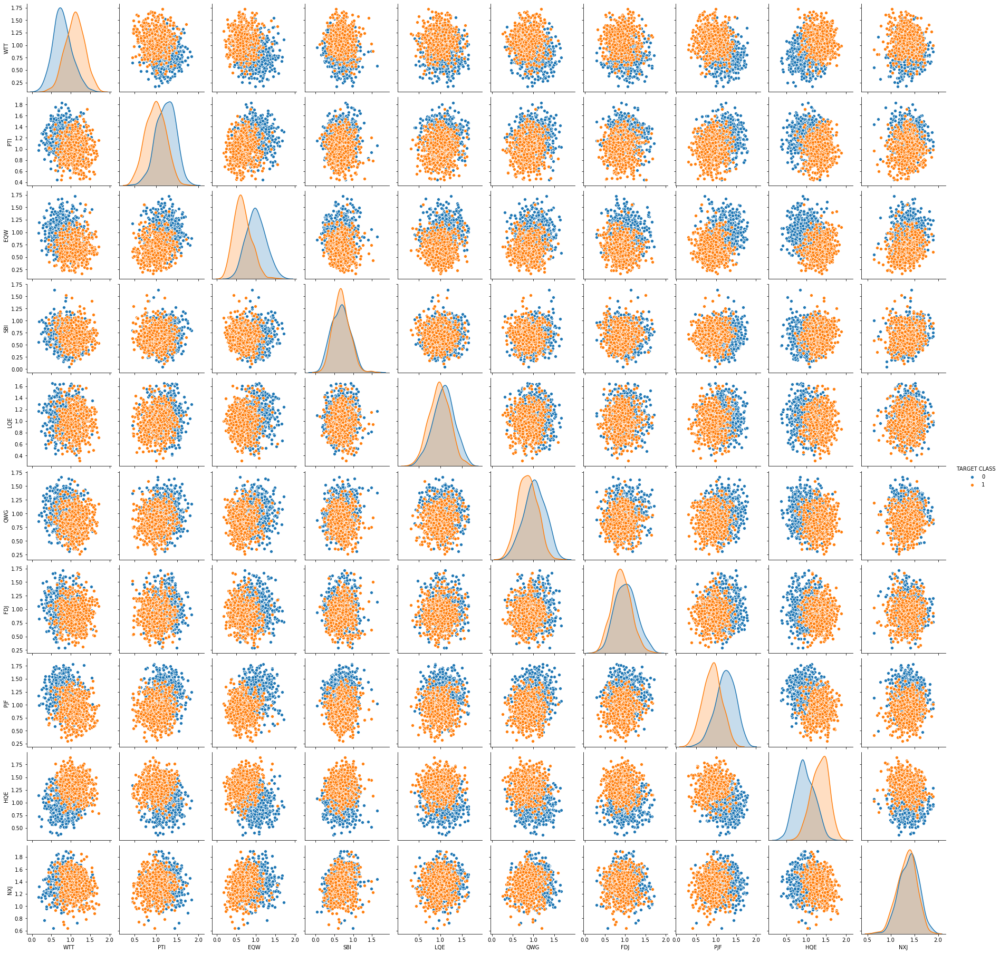

In [34]:
sns.pairplot(df,hue='TARGET CLASS')

In [36]:
from sklearn.model_selection import train_test_split

X = df_feat
y = df['TARGET CLASS']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4)

In [37]:
from sklearn.neighbors import KNeighborsClassifier

In [38]:
model = KNeighborsClassifier(n_neighbors=1) 

In [39]:
model.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [40]:
prediction = model.predict(X_test)

In [44]:
from sklearn.metrics import classification_report, confusion_matrix

In [52]:
print(" *********************************************** \n Confusion Matrix \n" , confusion_matrix(y_test, prediction))
print("*********************************************** \n Classification Report \n" , classification_report(y_test, prediction))

*********************************************** 
 Confusion Matrix 
 [[170  14]
 [ 15 201]]
*********************************************** 
 Classification Report 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92       184
           1       0.93      0.93      0.93       216

    accuracy                           0.93       400
   macro avg       0.93      0.93      0.93       400
weighted avg       0.93      0.93      0.93       400



In [53]:
error_rate = []
for i in range(1,40):
    model = KNeighborsClassifier(n_neighbors=i)
    model.fit(X_train, y_train)
    pred_i = model.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))
print(error_rate)

[0.0725, 0.1025, 0.0725, 0.0775, 0.0675, 0.065, 0.065, 0.0625, 0.065, 0.0575, 0.055, 0.055, 0.06, 0.0625, 0.065, 0.0625, 0.065, 0.0625, 0.0575, 0.0575, 0.0525, 0.0525, 0.0525, 0.0525, 0.055, 0.055, 0.055, 0.0525, 0.0525, 0.05, 0.05, 0.055, 0.05, 0.0475, 0.0475, 0.0475, 0.05, 0.05, 0.05]


Text(0.5, 1.0, 'Error rate vs K')

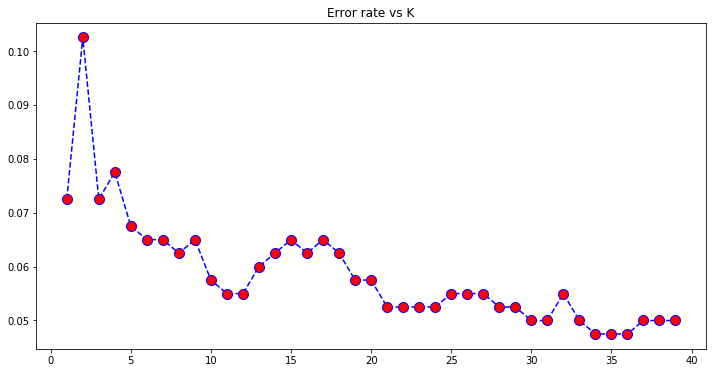

In [54]:
plt.plot(range(1,40),error_rate, color='blue', linestyle='--', marker='o', markerfacecolor='red',markersize=10)
plt.title('Error rate vs Kmodel = ')

In [55]:
model = KNeighborsClassifier(n_neighbors=21)
model.fit(X_train, y_train)
prediction = model.predict(X_test)

print(" *********************************************** \n Confusion Matrix \n" , confusion_matrix(y_test, prediction))
print("*********************************************** \n Classification Report \n" , classification_report(y_test, prediction))

*********************************************** 
 Confusion Matrix 
[[172  12]
 [  9 207]]
*********************************************** 
 Classification Report 
               precision    recall  f1-score   support

           0       0.95      0.93      0.94       184
           1       0.95      0.96      0.95       216

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400

